In [1]:
# In this small project, we will apply all the materials which have been discussed throughtout the last 4 weeks.
# We will use deep learning to count people in a dataset of images.

In [2]:
# Step 0: Importing the required libraries.
import mxnet as mx
from mxnet import image
from mxnet.gluon.data.vision import transforms
import gluoncv as gcv
import hashlib
from matplotlib import pyplot as plt
from pylab import rcParams
from gluoncv import model_zoo, data, utils
import numpy as np
import os
from pathlib import Path

rcParams['figure.figsize'] = 5, 10

/opt/anaconda3/lib/python3.8/site-packages/requests/__init__.py:89: RequestsDependencyWarning: urllib3 (2.0.6) or chardet (3.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


In [3]:
# Step 1: Selecting an appropriate model
# Selecting from the 200 different pre-trained model variantes from GluonCV

In [4]:
for model in gcv.model_zoo.get_model_list():
    print(model)

resnet18_v1
resnet34_v1
resnet50_v1
resnet101_v1
resnet152_v1
resnet18_v2
resnet34_v2
resnet50_v2
resnet101_v2
resnet152_v2
resnest14
resnest26
resnest50
resnest101
resnest200
resnest269
se_resnet18_v1
se_resnet34_v1
se_resnet50_v1
se_resnet101_v1
se_resnet152_v1
se_resnet18_v2
se_resnet34_v2
se_resnet50_v2
se_resnet101_v2
se_resnet152_v2
vgg11
vgg13
vgg16
vgg19
vgg11_bn
vgg13_bn
vgg16_bn
vgg19_bn
alexnet
densenet121
densenet161
densenet169
densenet201
squeezenet1.0
squeezenet1.1
googlenet
inceptionv3
xception
xception71
mobilenet1.0
mobilenet0.75
mobilenet0.5
mobilenet0.25
mobilenetv2_1.0
mobilenetv2_0.75
mobilenetv2_0.5
mobilenetv2_0.25
mobilenetv3_large
mobilenetv3_small
mobile_pose_resnet18_v1b
mobile_pose_resnet50_v1b
mobile_pose_mobilenet1.0
mobile_pose_mobilenetv2_1.0
mobile_pose_mobilenetv3_large
mobile_pose_mobilenetv3_small
ssd_300_vgg16_atrous_voc
ssd_300_vgg16_atrous_coco
ssd_300_vgg16_atrous_custom
ssd_512_vgg16_atrous_voc
ssd_512_vgg16_atrous_coco
ssd_512_vgg16_atrous_cus

In [5]:
# The objective is to count people, so certain types of model are better than others.
# We want an efficient model that consumes < 1GB of memory, and it should be fast and able to process > 100 
# images per second.

In [6]:
model_options = ['senet_154',
                 'mobilenetv3_large',
                 'faster_rcnn_fpn_resnet101_v1d_coco',
                 'yolo3_darknet53_coco',
                 'fcn_resnet101_coco',
                 'deeplab_resnet101_coco']
selected_model = 'yolo3_darknet53_coco'

In [7]:
assert selected_model in set(model_options)
assert hashlib.sha1(selected_model.encode('utf-8')).hexdigest()[:8] in ['9c7846f3', '1e6e3a3d']
assert hashlib.sha1(selected_model.encode('utf-8')).hexdigest()[:8] == '1e6e3a3d'

In [8]:
network = gcv.model_zoo.get_model(selected_model, pretrained=True)

In [9]:
# Step 2: A function to loads an image from disk given a filepath
# It should return an 8-bit image array, that's in MXNet's NDArray format and in HWC layout.

In [10]:
def load_image(filepath):
    return mx.image.imread(filepath)

In [11]:
test_filepath = 'people7.jpeg'
test_output = load_image(test_filepath)
assert test_output.shape[2] == 3
assert test_output.dtype == np.uint8
assert isinstance(test_output, mx.nd.NDArray)

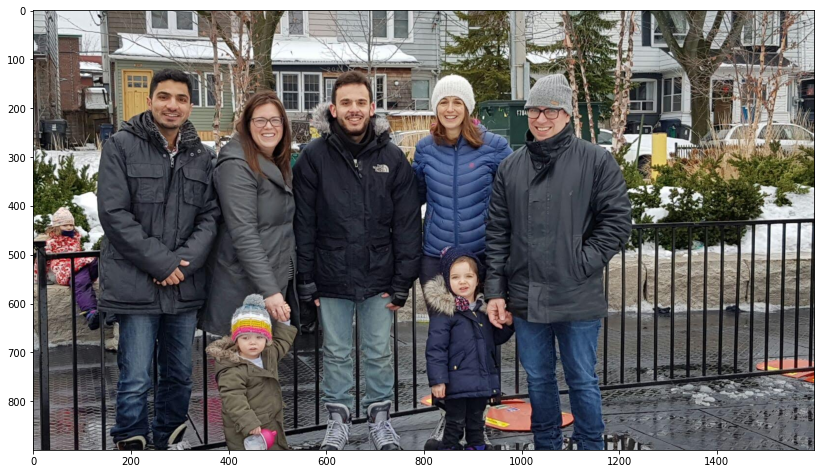

In [12]:
plt.imshow(test_output.asnumpy())
fig = plt.gcf()
fig.set_size_inches(14, 14)
plt.show()

In [13]:
# Step 3: Transform the image
# We need to transform the image so it can be used as input to the pre-trained network

In [14]:
def transform_image(array):
    return data.transforms.presets.yolo.transform_test(array, short=416)

In [15]:
norm_image, unnorm_image = transform_image(test_output)
assert norm_image.dtype == np.float32
assert unnorm_image.dtype == np.uint8

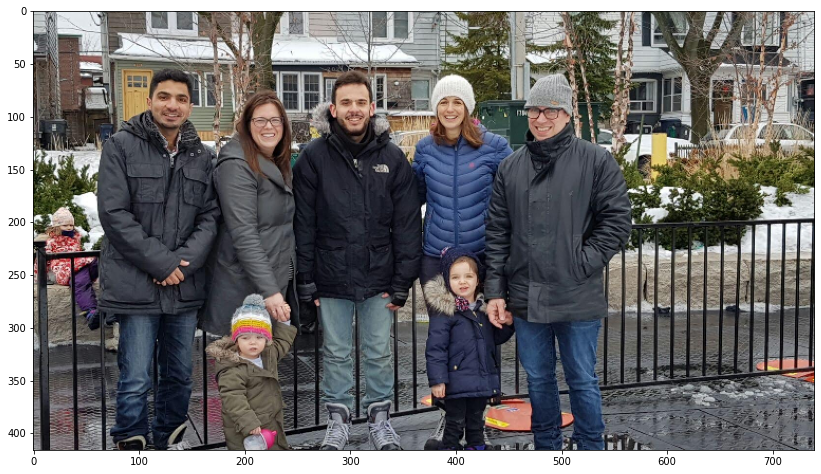

In [16]:
plt.imshow(unnorm_image)
fig = plt.gcf()
fig.set_size_inches(14, 14)
plt.show()

In [17]:
# Step 4: Using the model
# We need to pass a transformed image through the network to obtain bounding box and class predictions

In [18]:
def detect(network, data):
    return network(data)

In [19]:
class_ids, scores, bounding_boxes = detect(network, norm_image)
assert class_ids.shape == (1, 100, 1)
assert scores.shape == (1, 100, 1)
assert bounding_boxes.shape == (1, 100, 4)

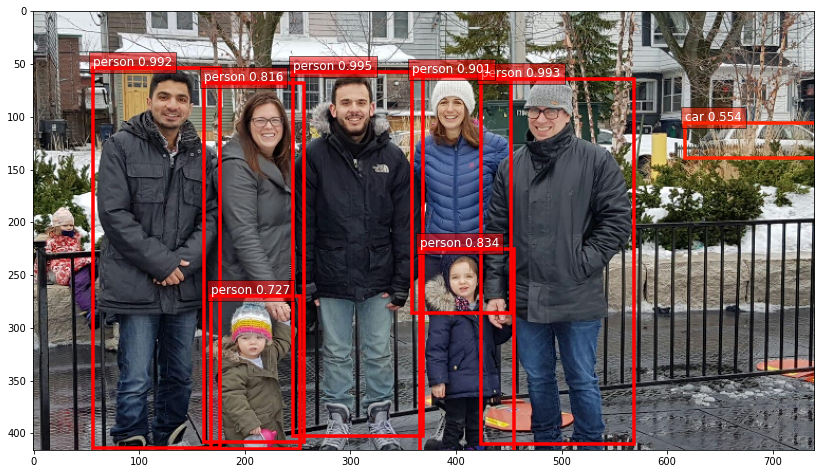

In [20]:
ax = utils.viz.plot_bbox(unnorm_image, bounding_boxes[0], scores[0], class_ids[0], class_names=network.classes)
fig = plt.gcf()
fig.set_size_inches(14, 14)
plt.show()

In [21]:
# Step 5: Counting Objects
# We should use the network output to determine the number of people in the image

In [22]:
def count_object(network, class_ids, scores, bounding_boxes, object_lable, threshold=0.50):
    number_of_objects = 0
    while(scores[0][number_of_objects] > threshold):
        number_of_objects += 1
    counter = 0
    idx = network.classes.index(object_lable)
    for index in class_ids[0][:number_of_objects]:
        if(index == idx):
            counter += 1
    return counter

In [23]:
for object_label in ["person", "bottle", "cup", "car"]:
    count = count_object(network, class_ids, scores, bounding_boxes, object_label)
    print("{} objects of class '{}' detected".format(count, object_label))

7 objects of class 'person' detected
0 objects of class 'bottle' detected
0 objects of class 'cup' detected
1 objects of class 'car' detected


In [24]:
num_people = count_object(network, class_ids, scores, bounding_boxes, "person")
assert num_people == 7

In [25]:
thresholds = [0, 0.5, 0.75, 0.99, 0.999]
for threshold in thresholds:
    num_people = count_object(network, class_ids, scores, bounding_boxes, "person", threshold=threshold)
    print("{} people were detected using a threshold of {}.".format(num_people, threshold))

15 people were detected using a threshold of 0.
7 people were detected using a threshold of 0.5.
6 people were detected using a threshold of 0.75.
3 people were detected using a threshold of 0.99.
0 people were detected using a threshold of 0.999.


In [26]:
# Step 6: Count People
# We will stack all the previous defined functions together.

In [27]:
class PersonCounter():
    def __init__(self, threshold):
        self._network = gcv.model_zoo.get_model(selected_model, pretrained=True)
        self._threshold = threshold

    def set_threshold(self, threshold):
        self._threshold = threshold
        
    def count(self, filepath, visualize=False):
        # YOUR CODE HERE
        norm_image, unnorm_image = transform_image(load_image(filepath))
        class_ids, scores, bounding_boxes = network(norm_image)
        # raise NotImplementedError()
        if visualize:
            self._visualize(unnorm_image, class_ids, scores, bounding_boxes)
        # YOUR CODE HERE
        num_people = count_object(self._network, class_ids, scores, bounding_boxes, 'person', threshold=self._threshold)
        # raise NotImplementedError()
        if num_people == 1:
            print('{} person detected in {}.'.format(num_people, filepath)) 
        else:
            print('{} people detected in {}.'.format(num_people, filepath))
        return num_people
    
    def _visualize(self, unnorm_image, class_ids, scores, bounding_boxes):
        """
        Since the transformed_image is in NCHW layout and the values are normalized,
        this method slices and transposes to give CHW as required by matplotlib,
        and scales (-2, +2) to (0, 255) linearly.
        """
        ax = utils.viz.plot_bbox(unnorm_image,
                                 bounding_boxes[0],
                                 scores[0],
                                 class_ids[0],
                                 class_names=self._network.classes)
        fig = plt.gcf()
        fig.set_size_inches(14, 14)
        plt.show()

7 people detected in people7.jpeg.


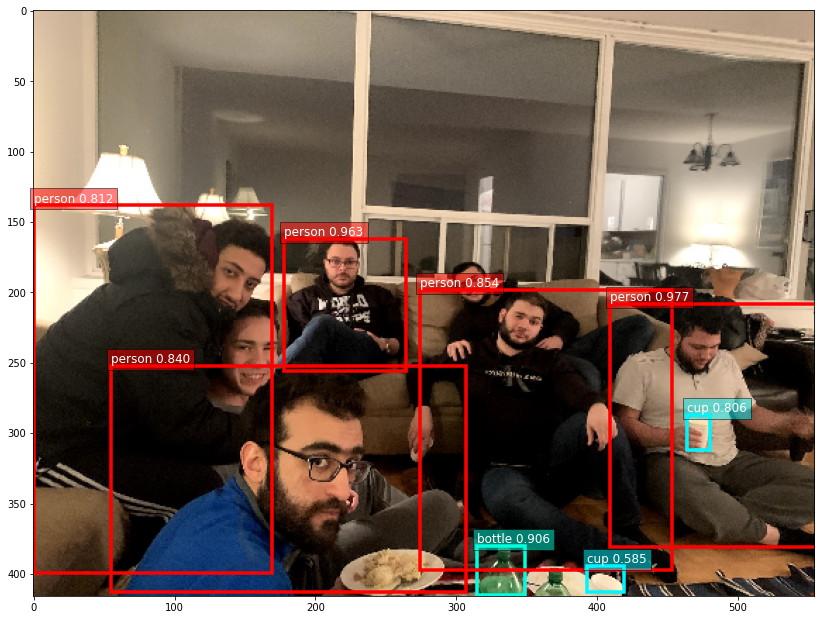

5 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people1.jpeg.


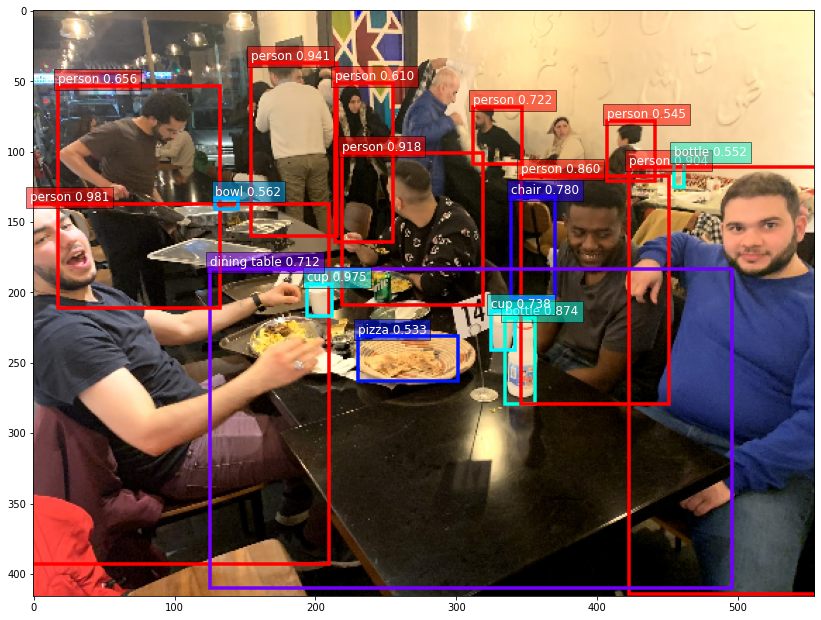

9 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people2.jpeg.


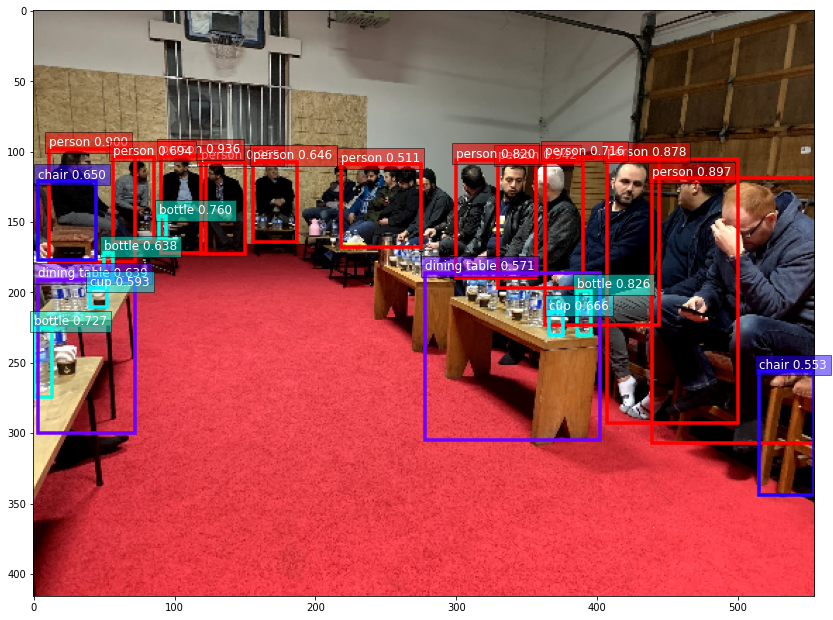

11 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people3.jpeg.


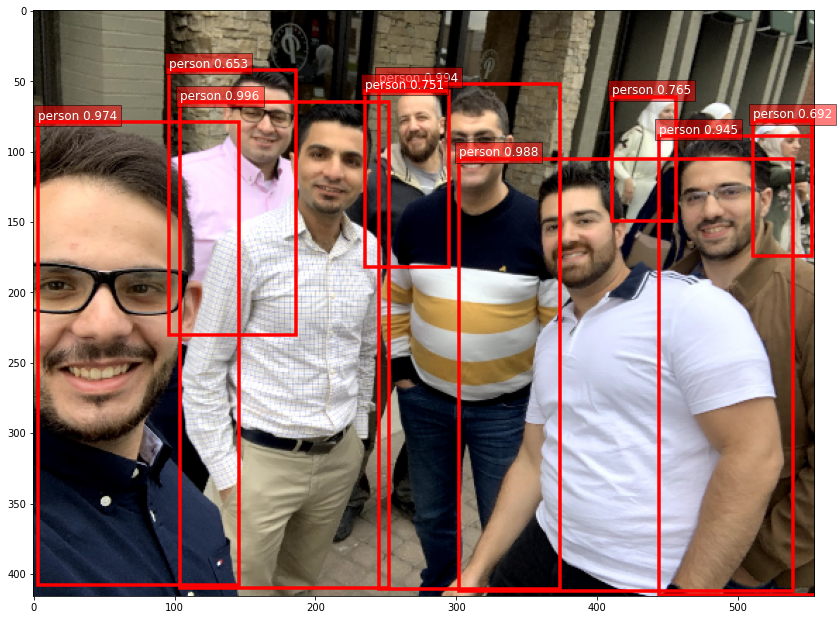

9 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people4.jpeg.


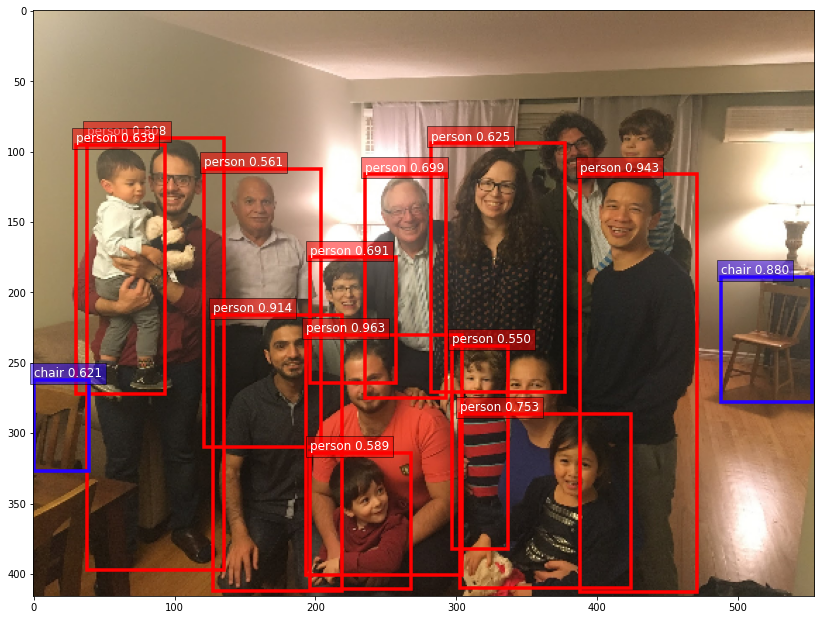

12 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people5.jpeg.


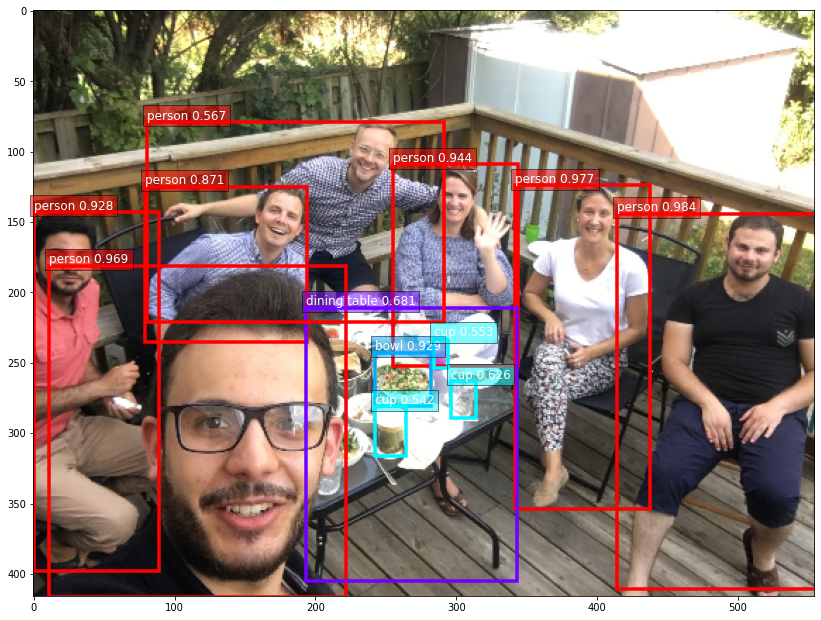

7 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people6.jpeg.


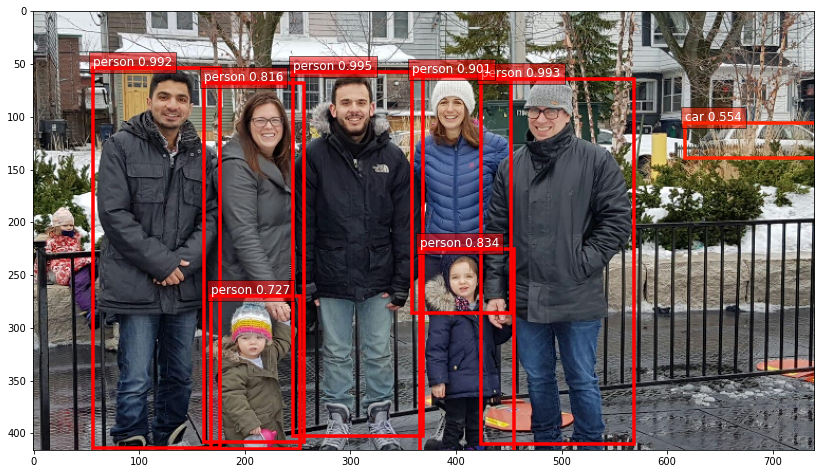

7 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people7.jpeg.


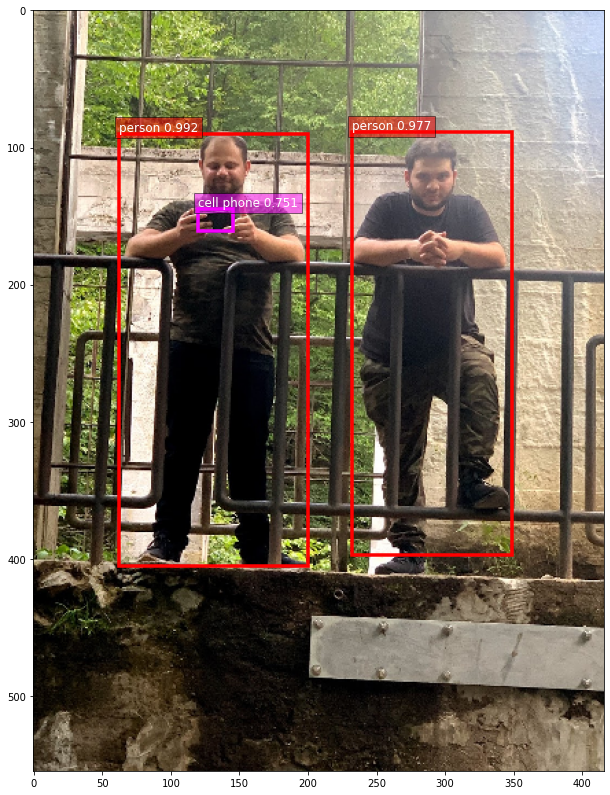

2 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people8.jpeg.


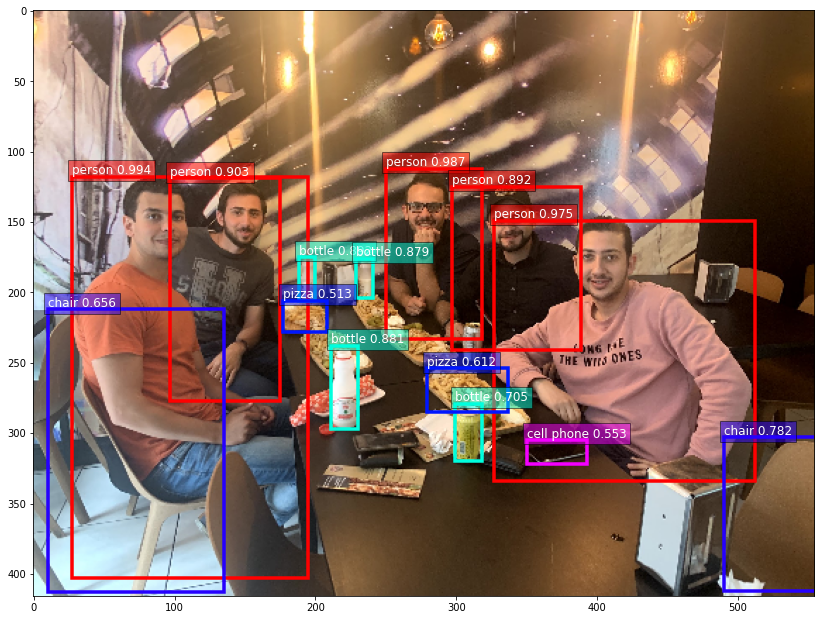

5 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people9.jpeg.


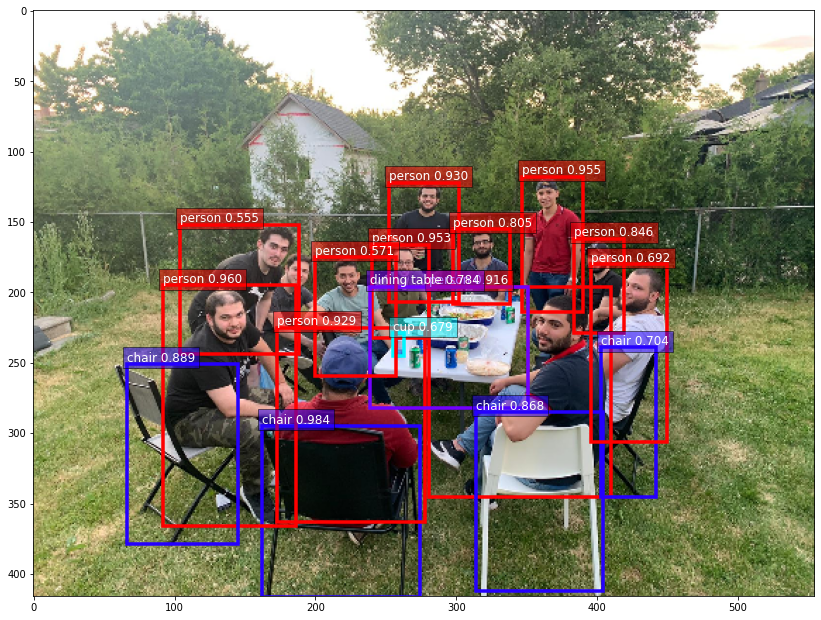

11 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people10.jpeg.


In [28]:
counter = PersonCounter(threshold=0.50)
assert counter.count(Path('people7.jpeg')) == 7
assert counter.count(Path('/Users/alaaasfour/Desktop/YORKU/EECS4070/people1.jpeg'), visualize=True) == 5
assert counter.count(Path('/Users/alaaasfour/Desktop/YORKU/EECS4070/people2.jpeg'), visualize=True) == 9
assert counter.count(Path('/Users/alaaasfour/Desktop/YORKU/EECS4070/people3.jpeg'), visualize=True) == 11
assert counter.count(Path('/Users/alaaasfour/Desktop/YORKU/EECS4070/people4.jpeg'), visualize=True) == 9
assert counter.count(Path('/Users/alaaasfour/Desktop/YORKU/EECS4070/people5.jpeg'), visualize=True) == 12
assert counter.count(Path('/Users/alaaasfour/Desktop/YORKU/EECS4070/people6.jpeg'), visualize=True) == 7
assert counter.count(Path('/Users/alaaasfour/Desktop/YORKU/EECS4070/people7.jpeg'), visualize=True) == 7
assert counter.count(Path('/Users/alaaasfour/Desktop/YORKU/EECS4070/people8.jpeg'), visualize=True) == 2
assert counter.count(Path('/Users/alaaasfour/Desktop/YORKU/EECS4070/people9.jpeg'), visualize=True) == 5
assert counter.count(Path('/Users/alaaasfour/Desktop/YORKU/EECS4070/people10.jpeg'), visualize=True) == 11

In [29]:
# Step 7: Count all people in a collection of images
# with our person counter, let's run through the whole dataset and count the number of people in our image dic

In [30]:
M6_IMAGES = Path('/Users/alaaasfour/Desktop/YORKU/EECS4070')
total_count = 0
for filepath in M6_IMAGES.glob('people*.jpeg'):
    total_count += counter.count(filepath)
print("### Summary: {} people were detected.".format(total_count))

9 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people2.jpeg.
11 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people3.jpeg.
9 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people4.jpeg.
2 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people8.jpeg.
5 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people9.jpeg.
12 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people5.jpeg.
7 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people6.jpeg.
11 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people10.jpeg.
7 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people7.jpeg.
5 people detected in /Users/alaaasfour/Desktop/YORKU/EECS4070/people1.jpeg.
### Summary: 78 people were detected.
